In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

### Read images and videos

#### Images

Load image

In [2]:
cat = cv.imread('Resources/Photos/cat.jpg')

Display image with OpenCV. (Press any key to close the window).

In [3]:
cv.imshow('Cat', cat)
cv.waitKey(0)
cv.destroyAllWindows()

Display image with matplotlib. The image needs to be converted from BGR to RGB, because OpenCV loads them in BGR

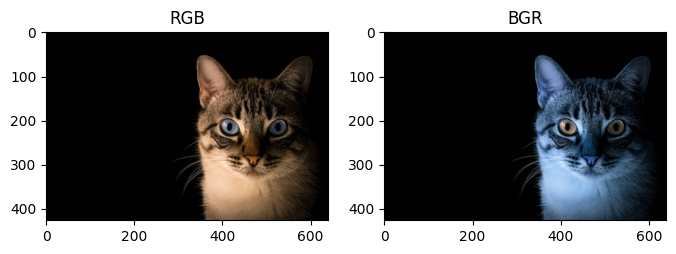

In [4]:
rgb_cat = cv.cvtColor(cat, cv.COLOR_BGR2RGB) # You could also use this function to change it to black and white
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title('RGB')
plt.imshow(rgb_cat)
plt.subplot(1, 2, 2)
plt.title('BGR')
plt.imshow(cat)
plt.show()

In [5]:
cat_large = cv.imread('Resources/Photos/cat_large.jpg')
cv.imshow('Cat', cat_large)
cv.waitKey(0)
cv.destroyAllWindows()

Opening large images in OpenCV does not automatically resize them to the size of the screen. Matplotlib automatically resize the image to the figure size with imshow, but only to display it, `rgb_cat_large` remains unchanged (Note: The axes shows the real size).

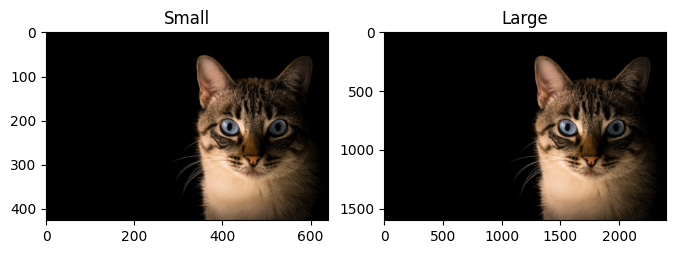

In [6]:
rgb_cat_large = cv.cvtColor(cat_large, cv.COLOR_BGR2RGB) # You could also use this function to change it to black and white
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title('Small')
plt.imshow(rgb_cat)
plt.subplot(1, 2, 2)
plt.title('Large')
plt.imshow(rgb_cat_large)
plt.show()

#### Videos

Reading a video from a file

In [7]:
capture = cv.VideoCapture('Resources/Videos/dog.mp4')
# Check if the video opened successfully
if not capture.isOpened():
    print("Error: Could not open video.")
fps = round(capture.get(cv.CAP_PROP_FPS))

We loop through the video frame by frame using `.read()`. This function returns two values: the frame itself and a boolean that tells us whether the frame was successfully read (e.g., it will return False if we've reached the end of the video, the file didn't load correctly, or the camera got disconnected).

To control the playback speed, we use `cv.waitKey()`, which waits for a key press for `int(1000/fps)` milliseconds — enough to match the video's original frame rate. It returns the ASCII value of the key pressed, or `-1` if no key was pressed during that time. If the key is `'q'`, we break the loop and stop the video.

In [8]:
while True:
    ret, frame = capture.read()
    if not ret:
        break  # End of video
    # Display frame
    cv.imshow('Video Frame', frame)
    # Press 'q' to quit
    if cv.waitKey(int(1000/fps)) & 0xFF == ord('q'):
        break

# Release resources
capture.release()
cv.destroyAllWindows()

Similarly, we can pull in video from a webcam:

In [9]:
capture = cv.VideoCapture(0)

while True:
    ret, frame = capture.read()
    if not ret:
        break
    cv.imshow('Webcam', frame)

    if cv.waitKey(20) & 0xFF == ord('q'):
        break

capture.release()
cv.destroyAllWindows()

### Resizing and rescaling images and videos

Function that scales the image using the `cv.resize` function.

In [10]:
def rescaleImage(img, scale=0.5):
    new_dimensions = (
        int(img.shape[1]*scale),
        int(img.shape[0]*scale)
    )
    return cv.resize(img, new_dimensions, interpolation = cv.INTER_AREA)

In [11]:
rescaled_cat = rescaleImage(cat)
cv.imshow('Cat', rescaled_cat)
cv.waitKey(0)
cv.destroyAllWindows()

We can use the same function for videos

In [12]:
capture = cv.VideoCapture('Resources/Videos/dog.mp4')
# Check if the video opened successfully
if not capture.isOpened():
    print("Error: Could not open video.")
fps = round(capture.get(cv.CAP_PROP_FPS))

while True:
    ret, frame = capture.read()
    if not ret:
        break  # End of video
    # Display frame
    scaled_frame = rescaleImage(frame)
    cv.imshow('Video Frame', scaled_frame)
    # Press 'q' to quit
    if cv.waitKey(int(1000/fps)) & 0xFF == ord('q'):
        break

# Release resources
capture.release()
cv.destroyAllWindows()

### Drawing onto images

An image is essentially just a 3D array: width, height, and colour channels. As I mentioned before, in OpenCV, colours are ordered as BGR, while matplotlib uses RGB. To create a black image, we can simply use NumPy to generate an array filled with zeroes.

In the code we use the 8-bit unsigned integer (uint8) data type, which allows values from 0 to 255 for each colour. Other common data types include 'uint16' (with a range from 0 to 65535) and 'float32' (with values between 0.0 and 1.0).

In [13]:
black_img = np.zeros((500,500,3), dtype='uint8')

We can also manipulate the array values to change the colour of the image directly.

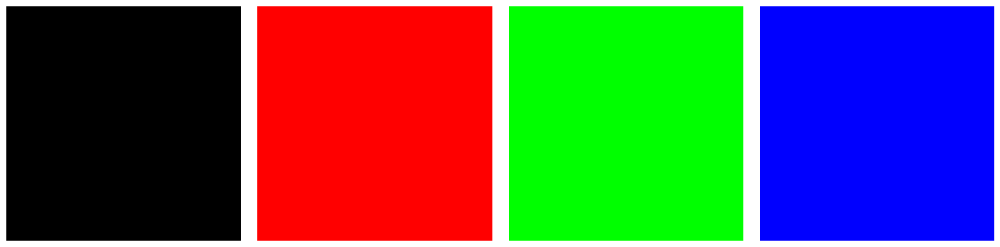

In [14]:
red_img = black_img.copy()
red_img[:] = (255, 0, 0) # Since we are displaying the images with matplotlib the first value corresponds to red
green_img = black_img.copy()
green_img[:] = (0,255,0)
blue_img = black_img.copy()
blue_img[:] = (0,0,255)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(black_img)
axes[0].axis('off')
axes[1].imshow(red_img)
axes[1].axis('off')
axes[2].imshow(green_img)
axes[2].axis('off')
axes[3].imshow(blue_img)
axes[3].axis('off')
plt.tight_layout()
plt.show()

We can also create a rectangle (or any shape) only using numpy.

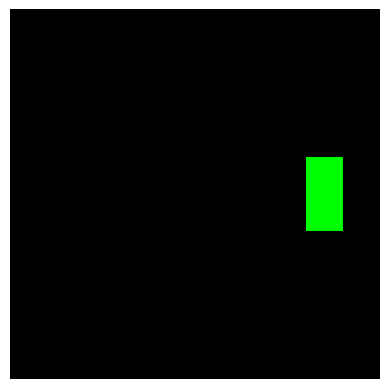

In [15]:
shapes_img = black_img.copy()
shapes_img[200:300,400:450] = (0,255,0)
plt.imshow(shapes_img)
plt.axis('off')
plt.show()

But OpenCV has functions that do this in a simpler way. You can also add text

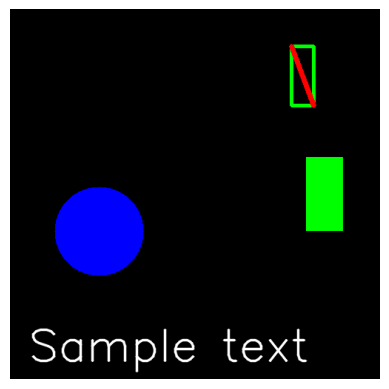

In [16]:
cv.rectangle(shapes_img,(380,50),(410,130),(0,255,0),3) # Green rectangle with thickness 3
cv.line(shapes_img,(380,50),(410,130),(255,0,0),5) # Red line with thickness 5
cv.circle(shapes_img,(120,300), 60, (0,0,255), cv.FILLED) # Blue filled circle
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(shapes_img,'Sample text',(25,475), font, 2,(255,255,255),2,cv.LINE_AA) # White text
plt.imshow(shapes_img)
plt.axis('off')
plt.show()

### Basic functions in OpenCV

#### Image transformations

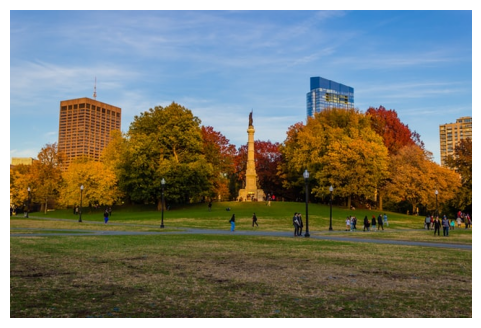

In [17]:
img = cv.imread('Resources/Photos/park.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(6, 4))
plt.imshow(img)
plt.axis('off')
plt.show()

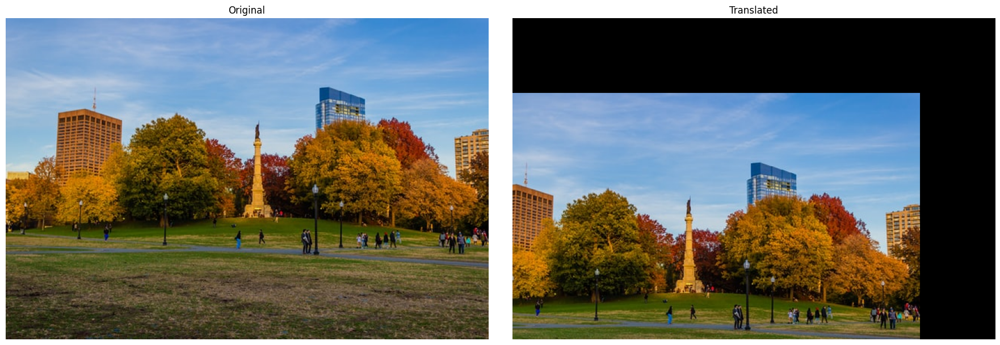

In [18]:
# Translation
def translate(img, x, y):
    transMat = np.float32([[1,0,x],[0,1,y]])
    dimensions = (img.shape[1], img.shape[0])
    return cv.warpAffine(img, transMat, dimensions)

translated = translate(img, -100, 100)

plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(translated)
plt.title('Translated')
plt.axis('off')

plt.tight_layout()
plt.show()

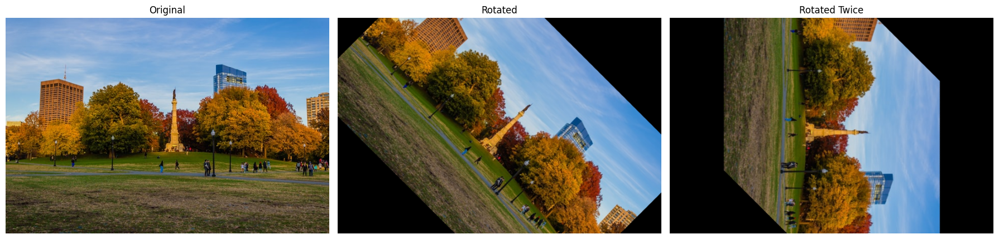

In [19]:
# Rotation
def rotate(img, angle, rotPoint=None):
    (height,width) = img.shape[:2]
    if rotPoint is None:
        rotPoint = (width//2,height//2)
    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width,height)
    return cv.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, -45)
rotated_rotated = rotate(rotated, -45)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(rotated)
plt.title('Rotated')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(rotated_rotated)
plt.title('Rotated Twice')
plt.axis('off')

plt.tight_layout()
plt.show()

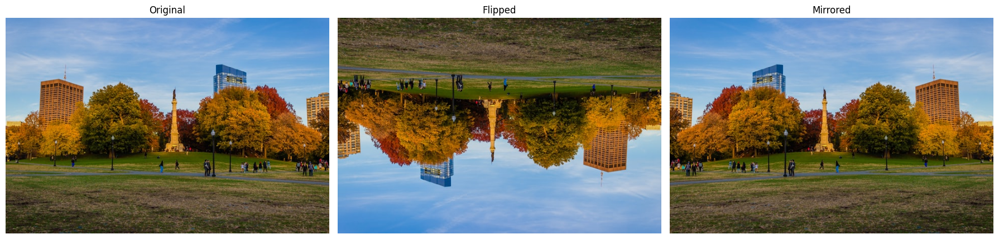

In [20]:
# Flipping
flip = cv.flip(img, -1)
mirrored = cv.flip(img, 1)


plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(flip)
plt.title('Flipped')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(mirrored)
plt.title('Mirrored')
plt.axis('off')

plt.tight_layout()
plt.show()

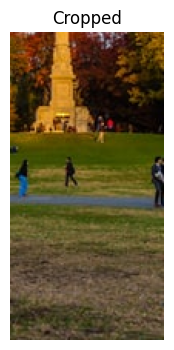

In [21]:
# Cropping
cropped = img[200:400, 300:400]

plt.figure(figsize=(4, 4))
plt.imshow(cropped)
plt.title('Cropped')
plt.axis('off')
plt.show()

#### Converting Colour Spaces

You can convert an image to other color spaces. We did this before to transform from the default BRG to RGB in order to display the cat image using matplotlib, but there are other colour spaces

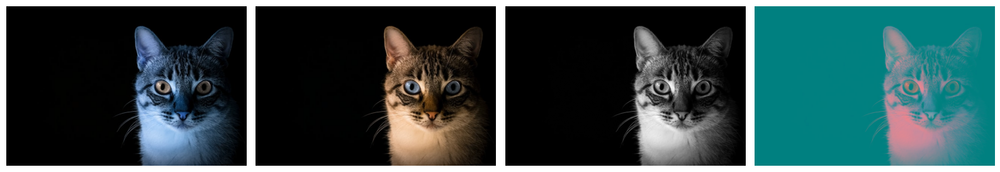

In [22]:
# Convert BGR to different color spaces
rgb = cv.cvtColor(cat, cv.COLOR_BGR2RGB)
gray = cv.cvtColor(cat, cv.COLOR_BGR2GRAY)
lab = cv.cvtColor(cat, cv.COLOR_BGR2LAB)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(cat)
axes[0].axis('off')
axes[1].imshow(rgb)
axes[1].axis('off')
axes[2].imshow(gray, cmap='gray')
axes[2].axis('off')
axes[3].imshow(lab)
axes[3].axis('off')
plt.tight_layout()
plt.show()

#### Smoothing and Blurring

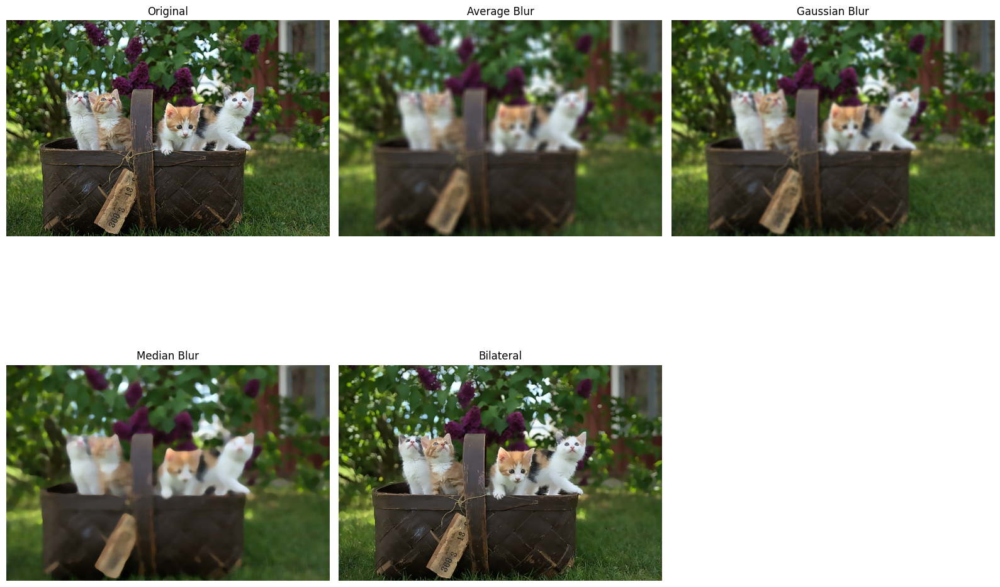

In [23]:
img = cv.imread('Resources/Photos/cats.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Apply filters
average = cv.blur(img, (11,11))
gauss = cv.GaussianBlur(img, (11,11), 0)
median = cv.medianBlur(img, 11)
bilateral = cv.bilateralFilter(img, 10, 35, 25)

# Convert to RGB for Matplotlib
images = [
    ('Original', img),
    ('Average Blur', average),
    ('Gaussian Blur', gauss),
    ('Median Blur', median),
    ('Bilateral', bilateral)
]

plt.figure(figsize=(16, 12))
for i, (title, image) in enumerate(images):
    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Thresholding

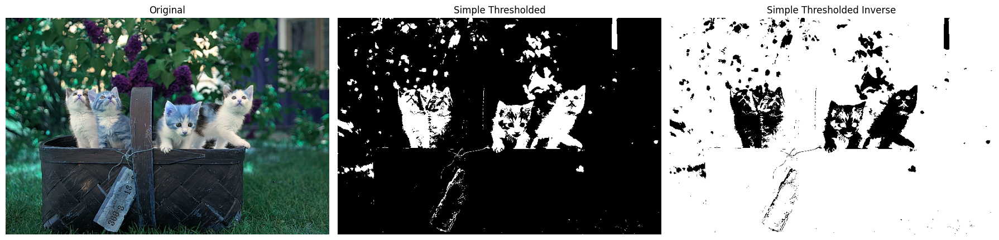

In [24]:
img = cv.imread('Resources/Photos/cats.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Simple Thresholding
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY )
threshold, thresh_inv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV )

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(thresh, cmap='gray')
plt.title('Simple Thresholded')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(thresh_inv, cmap='gray')
plt.title('Simple Thresholded Inverse')
plt.axis('off')

plt.tight_layout()
plt.show()

TODO: Explain adaptive thresholding

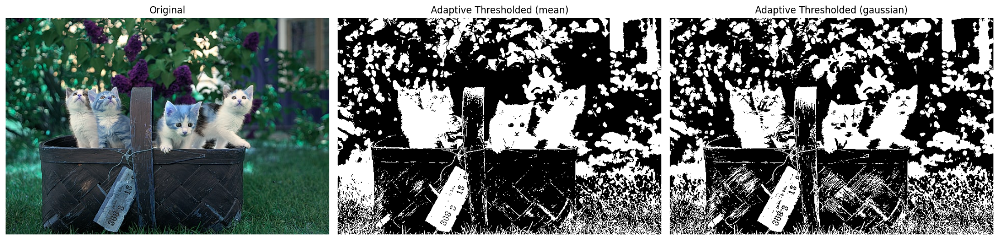

In [25]:
# Adaptive Thresholding
adaptive_thresh_mean = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 201, 0)
adaptive_thresh_gauss = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 201, 0)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(adaptive_thresh_mean, cmap='gray')
plt.title('Adaptive Thresholded (mean)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(adaptive_thresh_gauss, cmap='gray')
plt.title('Adaptive Thresholded (gaussian)')
plt.axis('off')

plt.tight_layout()
plt.show()

#### Masking

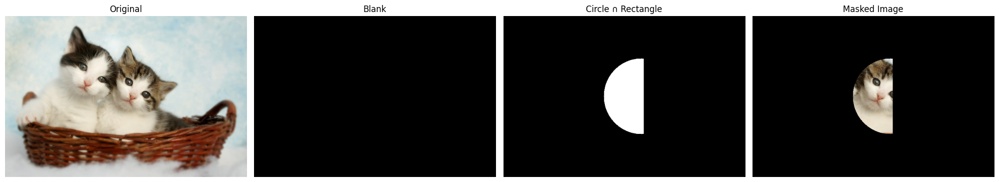

In [26]:
img = cv.imread('Resources/Photos/cats 2.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Create blank mask
blank = np.zeros(img.shape[:2], dtype='uint8')

# Circle mask
circle = cv.circle(blank.copy(), (img.shape[1]//2 + 45, img.shape[0]//2), 100, 255, -1)

# Rectangle mask
rectangle = cv.rectangle(blank.copy(), (30, 30), (370, 370), 255, -1)

# Combine masks
weird_shape = cv.bitwise_and(circle, rectangle)

# Apply mask
masked = cv.bitwise_and(img, img, mask=weird_shape)

# Plot all results side by side
images = [
    ('Original', img),
    ('Blank', blank),
    ('Circle ∩ Rectangle', weird_shape),
    ('Masked Image', masked)
]

plt.figure(figsize=(20, 5))
for i, (title, image) in enumerate(images):
    plt.subplot(1, 4, i + 1)
    if len(image.shape) == 2:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Contour Detection

The simplest way to detect contours is by using thresholding. This is faster and works well enough for most of the applications that I have worked on.

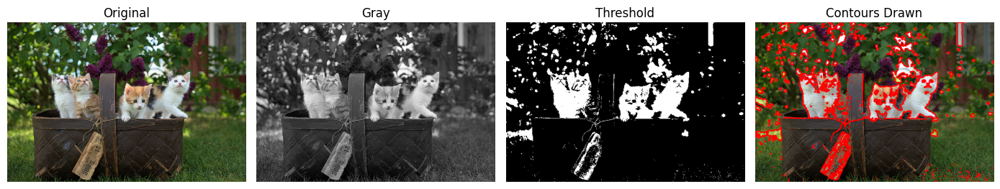

In [27]:
img = cv.imread('Resources/Photos/cats.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Grayscale
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

# Thresholding
ret, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)

# Contours
contours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)

# Drawing contours on top
contour_img = img.copy()
cv.drawContours(contour_img, contours, -1, (255,0,0), 2)

# Plot Original + each modification side by side
plt.figure(figsize=(14, 10))

plt.subplot(1, 4, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(gray, cmap='gray')
plt.title('Gray')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(thresh, cmap='gray')
plt.title('Threshold')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(contour_img)
plt.title('Contours Drawn')
plt.axis('off')

plt.tight_layout()
plt.show()

Another way of contour detection is by first getting the edges with the Canny algorithm and afterwards using this for the contour detection. Before using the Canny algorithm I blurred the image to reduce the number of edges detected.

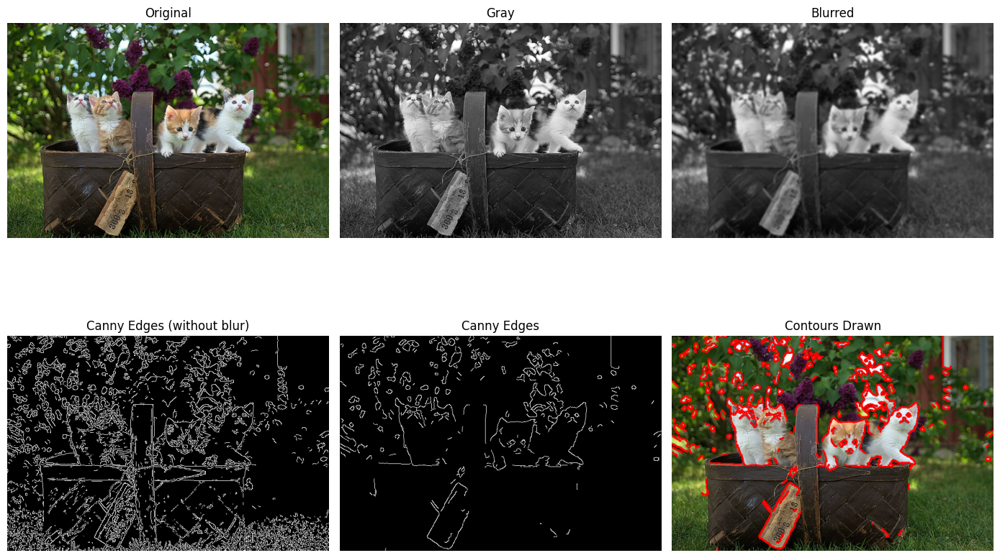

In [28]:
# Blur
blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)

# Canny edges
canny = cv.Canny(blur, 125, 175)

# Canny edges unblurred
canny_unblurred = cv.Canny(gray, 125, 175)

# Contours
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)

# Drawing contours on top
contour_img = img.copy()
cv.drawContours(contour_img, contours, -1, (255,0,0), 2)

# Plot Original + each modification side by side
plt.figure(figsize=(14, 10))

plt.subplot(2, 3, 1)
plt.imshow(img)
plt.title('Original')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(gray, cmap='gray')
plt.title('Gray')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(blur, cmap='gray')
plt.title('Blurred')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(canny_unblurred, cmap='gray')
plt.title('Canny Edges (without blur)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(contour_img)
plt.title('Contours Drawn')
plt.axis('off')

plt.tight_layout()
plt.show()